In [3]:
from IPython.display import display, Markdown

import pandas as pd
from pathlib import Path
from matplotlib import pyplot as plt
import seaborn as sns

def printmd(text: str) -> None:
    display(Markdown(text))

In [4]:
import sys
sys.path.append('../src')

from config import config
from rendering import sampling

config.set_data_dir("../data")

## Load metadata

In [5]:
images_metadata_path = Path("../data/HAM10000_metadata.csv")

images_metadata = pd.read_csv(images_metadata_path, index_col="image_id")

In [6]:
images_metadata.head(10)

,lesion_id,dx,dx_type,age,sex,localization
image_id,,,,,,
ISIC_0027419,HAM_0000118,bkl,histo,80.0,male,scalp
ISIC_0025030,HAM_0000118,bkl,histo,80.0,male,scalp
ISIC_0026769,HAM_0002730,bkl,histo,80.0,male,scalp
ISIC_0025661,HAM_0002730,bkl,histo,80.0,male,scalp
ISIC_0031633,HAM_0001466,bkl,histo,75.0,male,ear
ISIC_0027850,HAM_0001466,bkl,histo,75.0,male,ear
ISIC_0029176,HAM_0002761,bkl,histo,60.0,male,face
ISIC_0029068,HAM_0002761,bkl,histo,60.0,male,face
ISIC_0025837,HAM_0005132,bkl,histo,70.0,female,back


In [7]:
# check for na
printmd("## Check for NA")
images_metadata.isna().sum()

## Check for NA

lesion_id        0
dx               0
dx_type          0
age             57
sex              0
localization     0
dtype: int64

In [8]:
printmd("## Metadata info")
images_metadata.info()

## Metadata info

<class 'pandas.core.frame.DataFrame'>
Index: 10015 entries, ISIC_0027419 to ISIC_0032258
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     10015 non-null  object 
 1   dx            10015 non-null  object 
 2   dx_type       10015 non-null  object 
 3   age           9958 non-null   float64
 4   sex           10015 non-null  object 
 5   localization  10015 non-null  object 
dtypes: float64(1), object(5)
memory usage: 547.7+ KB


## Label distribution

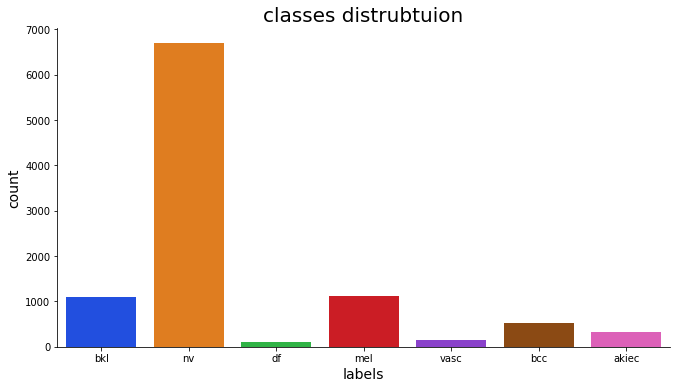

In [20]:
f = sns.catplot(x="dx", kind="count", palette='bright', data=images_metadata)
f.fig.set_size_inches(10, 5)

f.ax.set_title('classes distrubtuion', fontsize=20)
f.set_xlabels('labels', fontsize=14)
f.set_ylabels('count', fontsize=14)

In [10]:
images_metadata.dx.value_counts()

nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: dx, dtype: int64

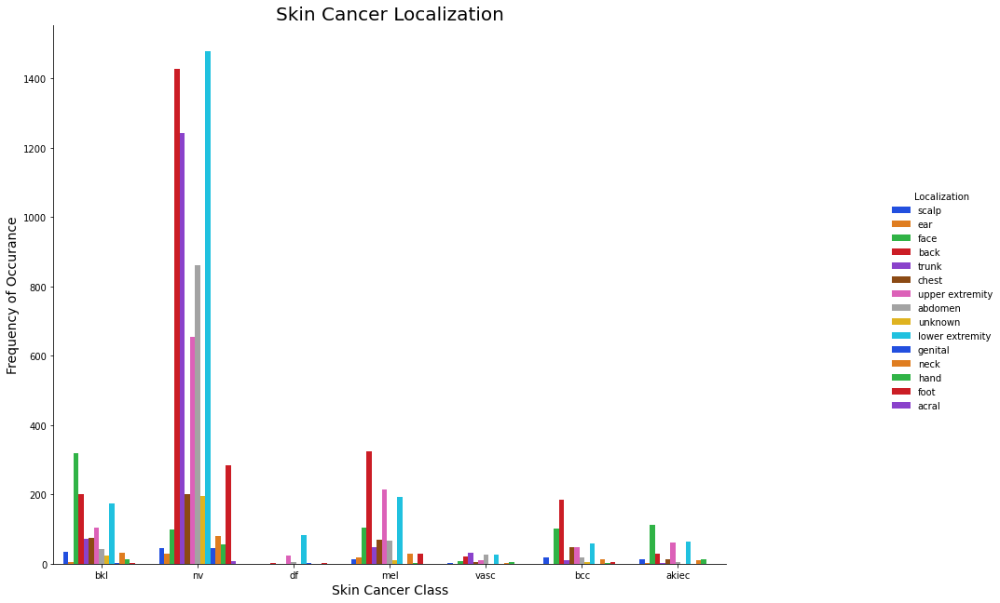

In [11]:
# Skin Cancer occurence body localization
g = sns.catplot(x="dx", kind="count", hue="localization", palette='bright', data=images_metadata)
g.fig.set_size_inches(16, 9)

g.ax.set_title('Skin Cancer Localization', fontsize=20)
g.set_xlabels('Skin Cancer Class', fontsize=14)
g.set_ylabels('Frequency of Occurance', fontsize=14)
g._legend.set_title('Localization')

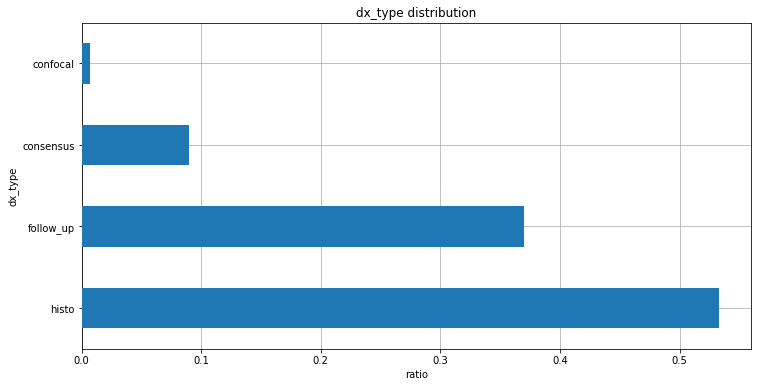

In [12]:
images_metadata["dx_type"].value_counts(normalize=True, sort=True).plot.barh(grid=True, figsize=(12,6), title="dx_type distribution", xlabel="dx_type", ylabel="count", zorder=10)
plt.xlabel("ratio")
plt.show()

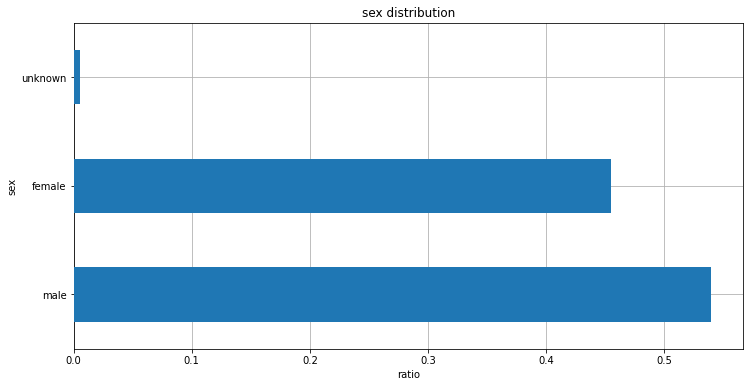

In [13]:
images_metadata["sex"].value_counts(normalize=True, sort=True).plot.barh(grid=True, figsize=(12,6), title="sex distribution", xlabel="sex", ylabel="count", zorder=10)
plt.xlabel("ratio")
plt.show()

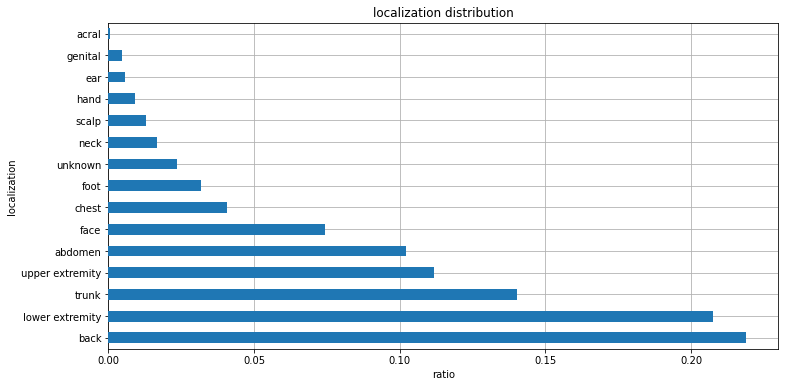

In [14]:
images_metadata["localization"].value_counts(normalize=True, sort=True).plot.barh(grid=True, figsize=(12,6), title="localization distribution", xlabel="localization", ylabel="count", zorder=10)
plt.xlabel("ratio")
plt.show()

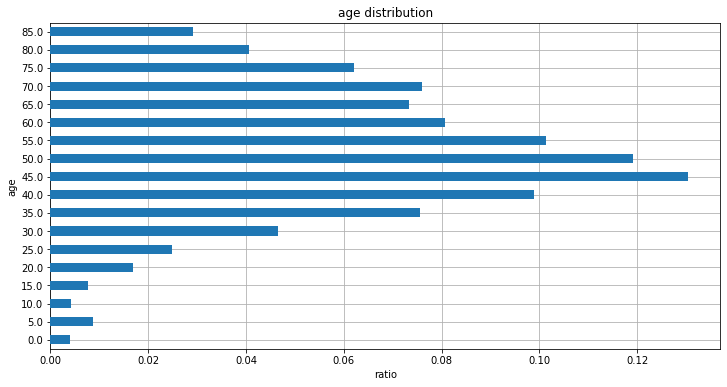

In [15]:
images_metadata["age"].value_counts(normalize=True, sort=False).sort_index().plot.barh(grid=True, figsize=(12,6), title="age distribution", xlabel="age", ylabel="count", zorder=10)
plt.xlabel("ratio")
plt.show()

# Number of images per lesion

In [16]:
images_metadata["lesion_id"].value_counts().value_counts(normalize=True)

1    0.738153
2    0.190495
3    0.065596
4    0.004552
5    0.000669
6    0.000535
Name: lesion_id, dtype: float64

../src/rendering/images.py:29: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  a = fig.add_subplot(cols, np.ceil(n_images / float(cols)), n + 1)


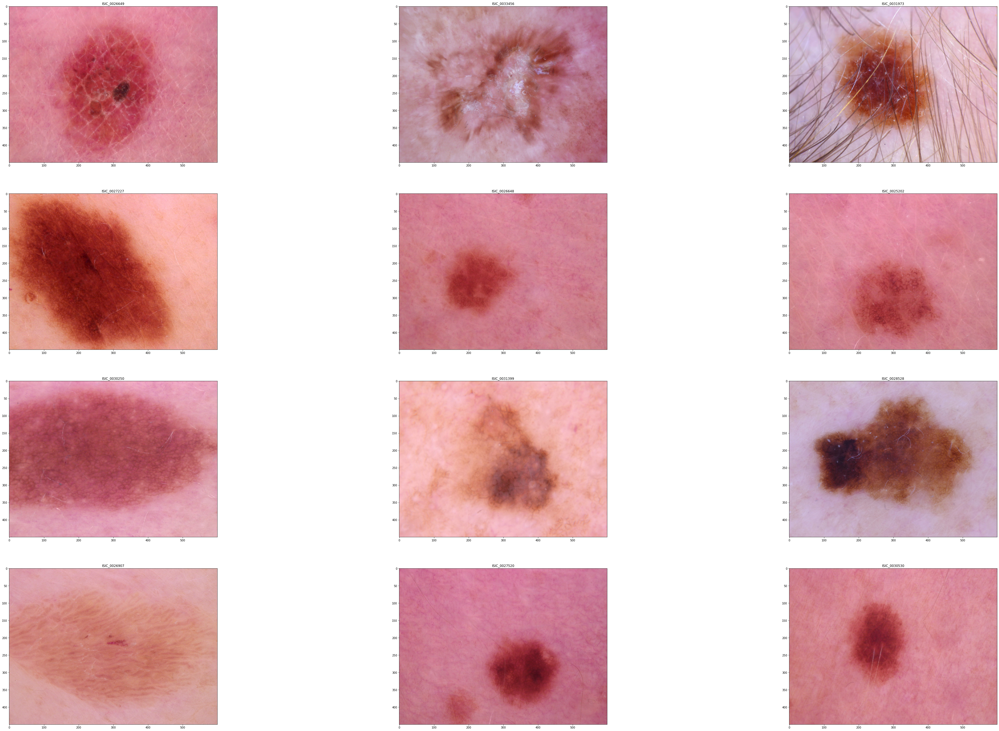

In [17]:
sampling.display_random_images(12, cols=4)
plt.show()